In [1]:
from __future__ import print_function
import warnings
warnings.filterwarnings("ignore")
import matplotlib
import matplotlib.pyplot as plt
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import sys
sys.path.append('/home/jonathak/VisualEncoder/DIP_decoder/GP-DIP/')
import numpy as np
from models import *
import torch
import torch.optim
import time
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from utils.denoising_utils import *
import _pickle as cPickle
torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": ".9"})

# display images
def np_plot(np_matrix, title):
    plt.clf()
    fig = plt.imshow(np_matrix.transpose(1, 2, 0), interpolation = 'nearest')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    plt.title(title)
    plt.axis('off')
    plt.pause(0.05) 

In [54]:
# My imports and parameters

from create_stroke_fMRI import StrokeVoxelPredictor

original_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/original_voxels.pt'
left_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/half_mask_side-left_centerX-None_centerY-None_mask_mean_voxels.pt'
right_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/half_mask_side-right_centerX-None_centerY-None_mask_mean_voxels.pt'
top_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/half_mask_side-top_centerX-None_centerY-None_mask_mean_voxels.pt'
bottom_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/half_mask_side-bottom_centerX-None_centerY-None_mask_mean_voxels.pt'
top_right_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/quadrant_mask_quad-bottom_left_mask_mean_voxels.pt'
top_left_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/quadrant_mask_quad-bottom_right_mask_mean_voxels.pt'
bottom_right_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/quadrant_mask_quad-top_left_mask_mean_voxels.pt'
bottom_left_masked_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/quadrant_mask_quad-top_right_mask_mean_voxels.pt'
gaussian_inner_50_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/gaussian_inner_mask_x0.5_y0.5_w50_mask_mean_voxels.pt'
gaussian_outer_30_voxels_path = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/gaussian_outer_mask_x0.5_y0.5_w30_mask_mean_voxels.pt'

masked_voxels_path = gaussian_inner_50_voxels_path

stroke_sub = 1
threshold = 0.8
img_idx = 22
# 22 was good

Load encoder model

In [3]:

sys.path.append('/home/romanb/PycharmProjects/BrainVisualReconst/')

encoder = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14_reg')

model = torch.load('/home/jonathak/VisualEncoder/Voxels_Prediction/model_ch128.pth').eval().cuda()
model_roman = torch.load('/home/romanb/data/NSD_models/dino_v2_ml_NSD.pth').eval().cuda()

Using cache found in /home/jonathak/.cache/torch/hub/facebookresearch_dinov2_main


Load data

In [4]:
import numpy as np
val_sub1 = True

from sklearn.model_selection import train_test_split

data_dir = '/net/mraid11/export/data/navvew/algonauts_2023_challenge_data'
num_voxels_subjects = np.load(data_dir + '/num_voxels_all_subjects.npy')

num_voxels_subjects = num_voxels_subjects.sum(1).astype(int)


data_dir = "/home/romanb/data/datasets/NVD/tutorial_data/subjects/subsuper/"
imgs = np.load(data_dir+"all_images.npy")
print(imgs.max(),imgs.min())


lvc_bitmap = np.load(data_dir+"lvc_bitmap.npy")
fmri_files = np.load(data_dir+"fmri.npz")

type_sample = fmri_files["type_sample"]
single_sub_fmri = fmri_files["single_sub_fmri"]
single_sub = fmri_files["single_sub"].astype(int)
multi_sub_fmri = fmri_files["multi_sub_fmri"]

imgs_single = imgs[type_sample==1]
imgs_multi = imgs[type_sample==2]

#sub0_ind = np.where(single_sub == 0)[0]
#subnot0_ind = np.where(single_sub != 0)[0]

single_sub_fmri_train, single_sub_fmri_val, single_sub_train, single_sub_val, imgs_single_train, imgs_single_val = train_test_split(single_sub_fmri,single_sub, imgs_single , test_size=0.1, random_state = 10)


single_sub_fmri_train  = single_sub_fmri_train
single_sub_train       = single_sub_train
imgs_single_train    = imgs_single_train

if(val_sub1):
    select = (single_sub_val == 0)
    single_sub_fmri_val = single_sub_fmri_val[select]
    single_sub_val      = single_sub_val[select]
    imgs_single_val   = imgs_single_val[select]

num_vox = num_voxels_subjects[0]
NC = np.load("/home/romanb/data/datasets/NVD/tutorial_data/noise_ceiling/noise_ceiling.npy")
select = NC[:num_vox]>0.5

# get all indices
inds = np.arange(num_vox)
inds_torch = torch.from_numpy(inds)

## selects voxels with snr>0.5
inds_nc = np.where(NC[:num_vox]>0.5)[0]
inds_nc_torch = torch.from_numpy(inds_nc)

255 0


Playing with data fMRI

In [13]:
print(single_sub_fmri_val.shape)
print(single_sub_fmri_val[img_idx,inds].shape)
print(single_sub_fmri_val[img_idx,inds].max(), single_sub_fmri_val[img_idx,inds].min())
print(single_sub_fmri_val[img_idx,inds_nc].shape)


(879, 39548)
(39548,)
2.32 -2.518
(13138,)


Creating the original fMRI and stroke fMRI target maps

In [68]:
device = torch.device('cuda')

threshold = 1
min_val = single_sub_fmri_val[img_idx,inds].min()

original_target_all = torch.from_numpy(single_sub_fmri_val[img_idx,inds]).unsqueeze(0).float()
original_target_nc = torch.from_numpy(single_sub_fmri_val[img_idx,inds_nc]).unsqueeze(0).float()

stroke_predictor = StrokeVoxelPredictor()
stroke_indices = stroke_predictor.create_stroked_voxels(img_idx, stroke_sub, threshold, original_voxels_path, masked_voxels_path, only_indices=True)

stroke_target_all = original_target_all.clone().detach()
stroke_target_all[0, stroke_indices] = stroke_target_all.min()
stroke_target_all = stroke_target_all.float()
stroke_target_nc = stroke_target_all[:,inds_nc]

# Counting stroke voxels in the nc case
num_stroke_nc = torch.sum((original_target_nc != min_val) & (stroke_target_nc == min_val))

# Moving to cuda
stroke_target_all = stroke_target_all.to(device)
stroke_target_nc = stroke_target_nc.to(device)
original_target_all = original_target_all.to(device)
original_target_nc = original_target_nc.to(device)

# Checking all is well
print(f"Num of stroke indices in the nc case: {num_stroke_nc} out of {stroke_target_nc.shape[1]}")
print('Original target all:', original_target_all.shape, original_target_all.device)
print('Stroke target all:', stroke_target_all.shape, stroke_target_all.device)
print('Original target nc:', original_target_nc.shape, original_target_nc.device)
print('Stroke target nc:', stroke_target_nc.shape, stroke_target_nc.device)


Num of stroke indices: 186 out of 39548
Num of stroke indices in the nc case: 186 out of 13138
Original target all: torch.Size([1, 39548]) cuda:0
Stroke target all: torch.Size([1, 39548]) cuda:0
Original target nc: torch.Size([1, 13138]) cuda:0
Stroke target nc: torch.Size([1, 13138]) cuda:0


DIP params

In [17]:
INPUT = 'noise'
pad = 'reflection'
OPT_OVER = 'net' # optimize over the net parameters only
c = 1./30.
reg_noise_std = 1./30.

learning_rate = LR = 0.001
exp_weight=0.99
input_depth = 32 
roll_back = True # to prevent numerical issues
num_iter = 601 # max iterations
burnin_iter = 7000 # burn-in iteration for SGLD
weight_decay = 5e-8
show_every =  50
mse = torch.nn.MSELoss().type(dtype) # loss
save_iter = 200
#img_noisy_torch = np_to_torch(img_rec).type(dtype)

In [7]:
mean = torch.tensor((0.485, 0.456, 0.406)).reshape(1,3,1,1).cuda()
std = torch.tensor((0.229, 0.224, 0.225)).reshape(1,3,1,1).cuda()

def trans_imgs(imgs):
    imgs = imgs/255.0
    imgs =  imgs.transpose([2,0,1])
    imgs =  torch.from_numpy(imgs.astype(float)).float()
    return imgs

Fit image

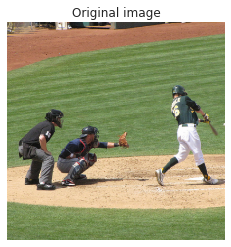

Starting optimization with ADAM
img min max:
0.8716307 0.14957562
loss tensor(0.0406, device='cuda:0', grad_fn=<MseLossBackward0>)


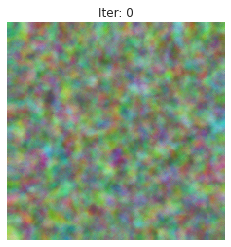

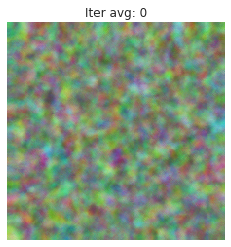

img min max:
0.8716307 0.14957562
loss tensor(0.0055, device='cuda:0', grad_fn=<MseLossBackward0>)


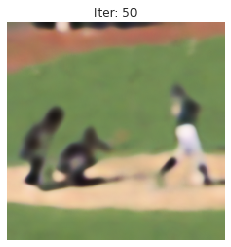

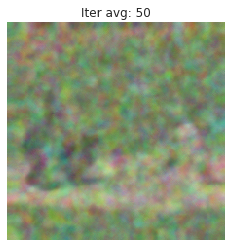

img min max:
0.8716307 0.14957562
loss tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>)


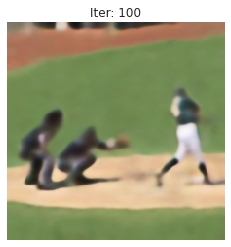

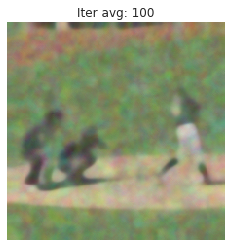

img min max:
0.8716307 0.14957562
loss tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>)


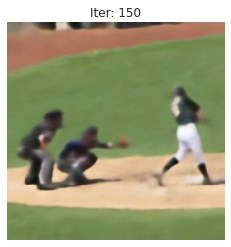

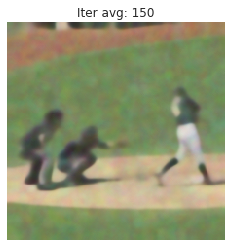

img min max:
0.8716307 0.14957562
loss tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>)


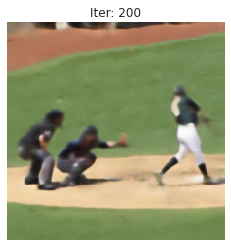

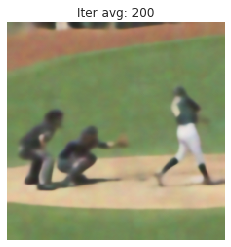

img min max:
0.8716307 0.14957562
loss tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>)


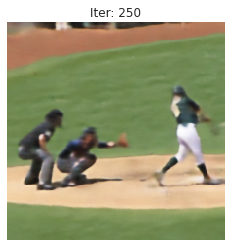

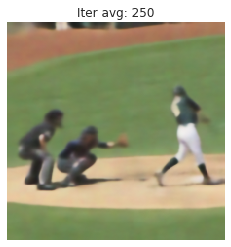

img min max:
0.8716307 0.14957562
loss tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>)


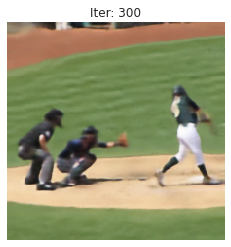

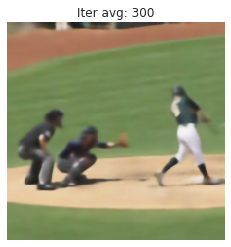

img min max:
0.8716307 0.14957562
loss tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>)


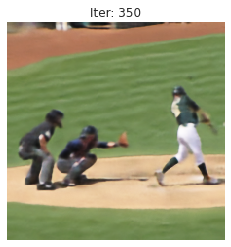

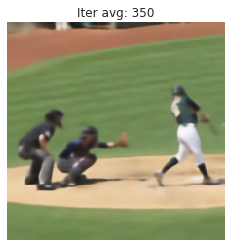

img min max:
0.8716307 0.14957562
loss tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>)


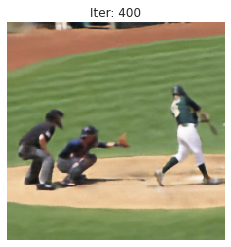

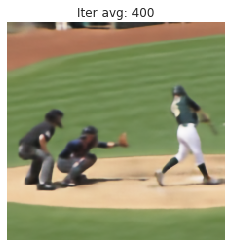

img min max:
0.8716307 0.14957562
loss tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>)


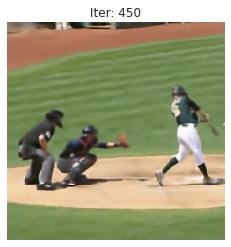

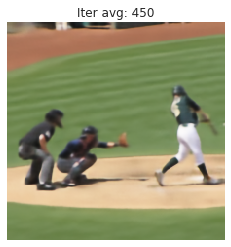

img min max:
0.8716307 0.14957562
loss tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>)


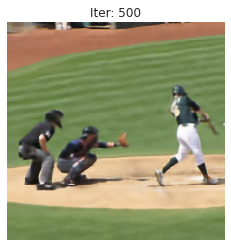

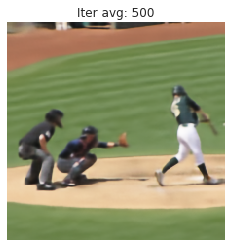

img min max:
0.8716307 0.14957562
loss tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>)


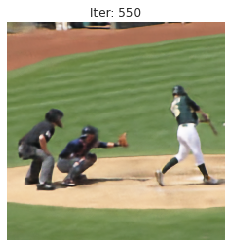

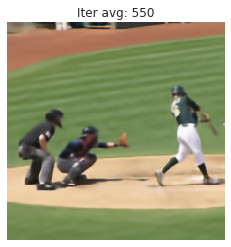

img min max:
0.8716307 0.14957562
loss tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>)


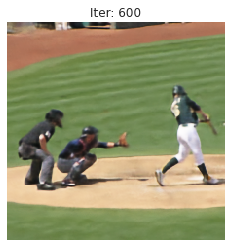

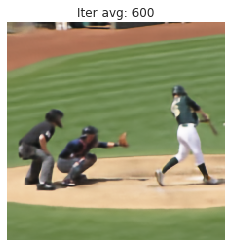

In [18]:
import torch.nn.functional as F

in_img = trans_imgs(imgs_single_val[img_idx])

net = get_net(input_depth, 'skip', pad,
            skip_n33d=128, 
            skip_n33u=128,
            skip_n11=2,
            num_scales=3,
            upsample_mode='bilinear').type(dtype)

## Optimize
net_input = get_noise(input_depth, INPUT, (224, 224),var=0.1).type(dtype).detach()
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0
i = 0

out = net(net_input)
rec_img_np = out.detach().cpu().numpy()[0]



# save tmp PSNR for different learning strategies
fancy_sgd_noise_psnr_list = [] # psnr between out and noise image
fancy_sgd_psnr_list = [] # psnr between sgd out and gt
fancy_sgd_expm_psnr_list = [] # psnr between exp avg and gt
fancy_sgd_out_1800 = None
fancy_sgd_expm_out_1800 = None
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    out = net(net_input)

    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
    
    #enc_in = (sigmoid(out)-mean)/std
    #vox_pred = model(enc_in, torch.arange(num_vox).unsqueeze(0).cuda() )
    
    loss = F.mse_loss(out, in_img.cuda())

    if i % show_every == 0:

        print('img min max:')
        print(rec_img_np.max(),rec_img_np.min())
        
        
        print('loss',loss)
        #print('mae',mae)


    #grad = grad.transpose(0,3,1,2)

    #grad_torch = np_to_torch(grad).type(dtype)
    
    
    #total_loss = torch.sum(out* grad_torch)
    loss.backward()

    out_np = out.detach().cpu().numpy()[0]
    out_avg_np = out_avg.detach().cpu().numpy()[0]

    if i % show_every == 0:
        np_plot(out.detach().cpu().numpy()[0], 'Iter: '+str(i))
        np_plot(out_avg_np, 'Iter avg: '+str(i))

    i += 1
    return loss

# Plotting the original image
np_plot(in_img.cpu().numpy(),'Original image')

## Optimizing 
print('Starting optimization with ADAM')
optimizer = torch.optim.Adam(net.parameters(), lr=LR)
for j in range(num_iter):
    optimizer.zero_grad()
    closure()
    optimizer.step()

# Saving the fitted network
torch.save({
    'net_state': net.state_dict(),
    'out_avg': out_avg
}, 'dip_on_image.pth')

torch.cuda.empty_cache()

Experiment 1: Decoding using original fMRI on high SNR voxels (Roman's case)

Starting optimization with ADAM
img min max:
0.8716307 0.14957562
loss tensor(0.2321, device='cuda:0', grad_fn=<MseLossBackward0>)


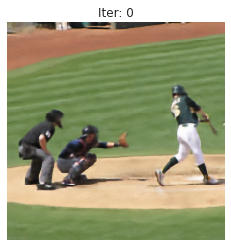

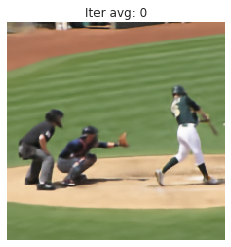

img min max:
0.8716307 0.14957562
loss tensor(0.1113, device='cuda:0', grad_fn=<MseLossBackward0>)


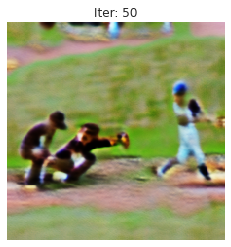

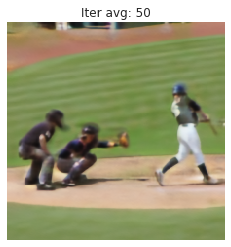

img min max:
0.8716307 0.14957562
loss tensor(0.1054, device='cuda:0', grad_fn=<MseLossBackward0>)


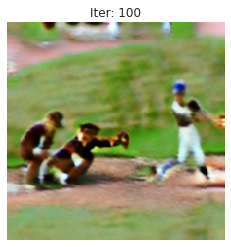

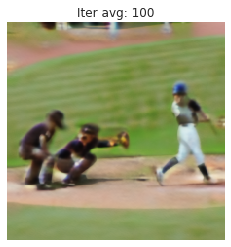

img min max:
0.8716307 0.14957562
loss tensor(0.1024, device='cuda:0', grad_fn=<MseLossBackward0>)


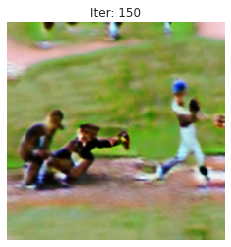

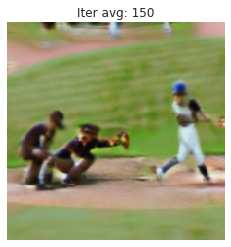

img min max:
0.8716307 0.14957562
loss tensor(0.1004, device='cuda:0', grad_fn=<MseLossBackward0>)


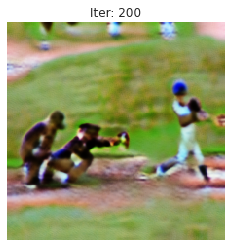

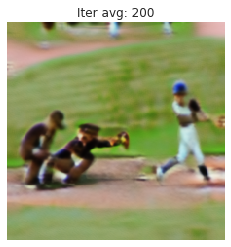

img min max:
0.8716307 0.14957562
loss tensor(0.1006, device='cuda:0', grad_fn=<MseLossBackward0>)


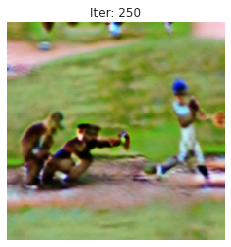

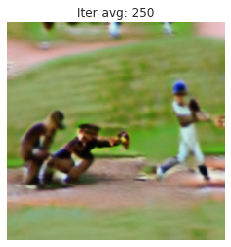

img min max:
0.8716307 0.14957562
loss tensor(0.0974, device='cuda:0', grad_fn=<MseLossBackward0>)


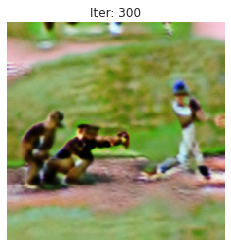

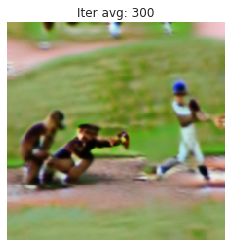

img min max:
0.8716307 0.14957562
loss tensor(0.0962, device='cuda:0', grad_fn=<MseLossBackward0>)


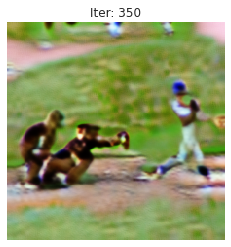

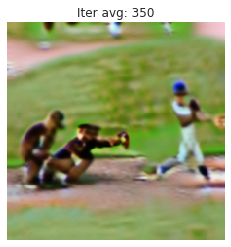

img min max:
0.8716307 0.14957562
loss tensor(0.0933, device='cuda:0', grad_fn=<MseLossBackward0>)


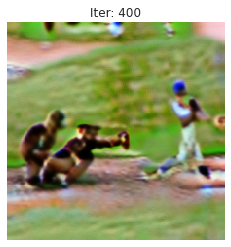

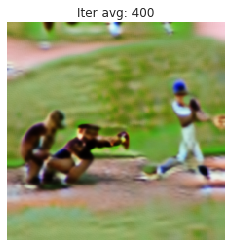

img min max:
0.8716307 0.14957562
loss tensor(0.0937, device='cuda:0', grad_fn=<MseLossBackward0>)


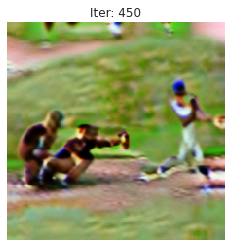

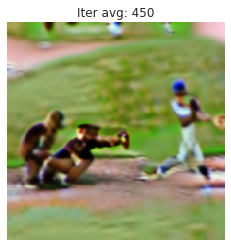

img min max:
0.8716307 0.14957562
loss tensor(0.0934, device='cuda:0', grad_fn=<MseLossBackward0>)


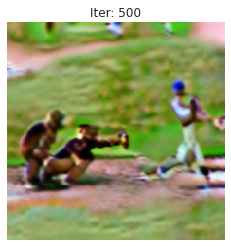

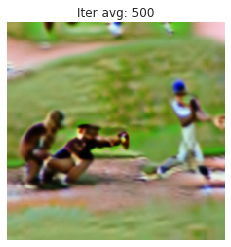

img min max:
0.8716307 0.14957562
loss tensor(0.0917, device='cuda:0', grad_fn=<MseLossBackward0>)


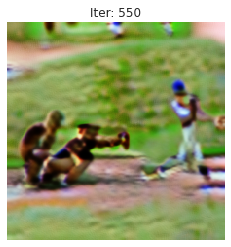

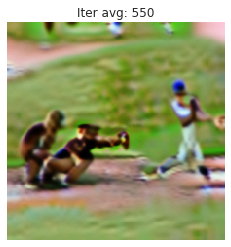

img min max:
0.8716307 0.14957562
loss tensor(0.0924, device='cuda:0', grad_fn=<MseLossBackward0>)


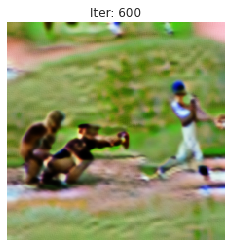

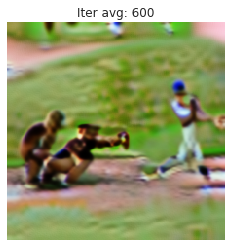

In [19]:

net = get_net(input_depth, 'skip', pad,
            skip_n33d=128, 
            skip_n33u=128,
            skip_n11=2,
            num_scales=3,
            upsample_mode='bilinear').type(dtype)

checkpoint = torch.load('dip_on_image.pth')
net.load_state_dict(checkpoint['net_state'])

out_avg = checkpoint['out_avg']

reg_noise_std = 1./30.
i = 0 


def total_variation_loss(img, weight= 1.0):
    bs_img, c_img, h_img, w_img = img.size()
    tv_h = torch.pow(img[:,:,1:,:]-img[:,:,:-1,:], 2).sum()
    tv_w = torch.pow(img[:,:,:,1:]-img[:,:,:,:-1], 2).sum()
    return weight*(tv_h+tv_w)/(bs_img*c_img*h_img*w_img)

    
# save tmp PSNR for different learning strategies
fancy_sgd_noise_psnr_list = [] # psnr between out and noise image
fancy_sgd_psnr_list = [] # psnr between sgd out and gt
fancy_sgd_expm_psnr_list = [] # psnr between exp avg and gt
fancy_sgd_out_1800 = None
fancy_sgd_expm_out_1800 = None

def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input, out_avg_np
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    out = net(net_input)

    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
    
    enc_in = (out-mean)/std
    vox_pred = model_roman(enc_in, inds_nc_torch.unsqueeze(0).cuda())
    
    loss = F.mse_loss(vox_pred, original_target_nc)#+total_variation_loss(out)+0.01*norm_6(out)#- 0.1*torch.mean(F.cosine_similarity(vox_pred, target))

    if i % show_every == 0:

        print('img min max:')
        print(rec_img_np.max(),rec_img_np.min())
        print('loss',loss)

    loss.backward()

    out_np = out.detach().cpu().numpy()[0]
    out_avg_np = out_avg.detach().cpu().numpy()[0]
    
    if i == save_iter:
        np.save(f'/home/jonathak/VisualEncoder/DIP_decoder/transformation_test/no_stroke_iter_{save_iter}_img_{img_idx}.npy',out_avg_np)
        
    if i % show_every == 0:
        np_plot(out.detach().cpu().numpy()[0], 'Iter: '+str(i))
        np_plot(out_avg_np, 'Iter avg: '+str(i))


    i += 1
    return loss

## Optimizing 
print('Starting optimization with ADAM')
optimizer = torch.optim.Adam(net.parameters(), lr=LR)
for j in range(num_iter):
    optimizer.zero_grad()
    closure()
    optimizer.step()

torch.cuda.empty_cache()

np.save(f'/home/jonathak/VisualEncoder/DIP_decoder/transformation_test/no_stroke_final_img_{img_idx}.npy',out_avg_np)

Experiment 2: Decoding using the left stroke fMRI on high SNR voxels

Starting optimization with ADAM
img min max:
0.8716307 0.14957562
loss tensor(0.3145, device='cuda:0', grad_fn=<MseLossBackward0>)


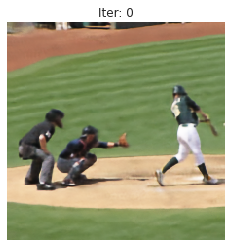

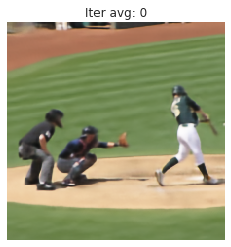

img min max:
0.8716307 0.14957562
loss tensor(0.1803, device='cuda:0', grad_fn=<MseLossBackward0>)


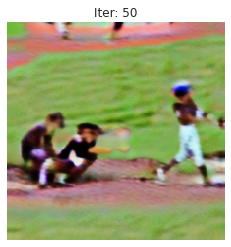

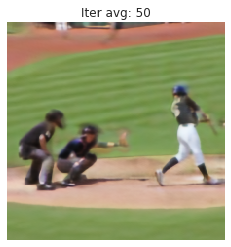

img min max:
0.8716307 0.14957562
loss tensor(0.1728, device='cuda:0', grad_fn=<MseLossBackward0>)


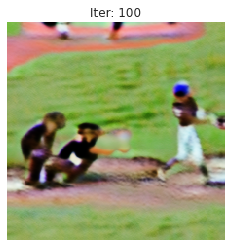

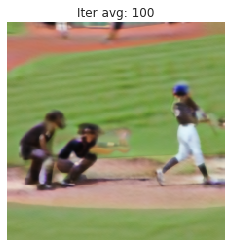

img min max:
0.8716307 0.14957562
loss tensor(0.1684, device='cuda:0', grad_fn=<MseLossBackward0>)


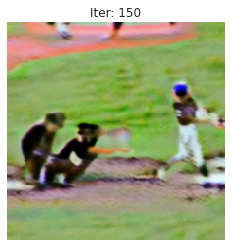

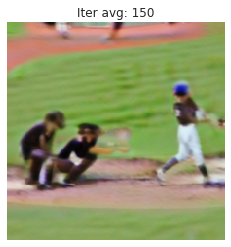

img min max:
0.8716307 0.14957562
loss tensor(0.1642, device='cuda:0', grad_fn=<MseLossBackward0>)


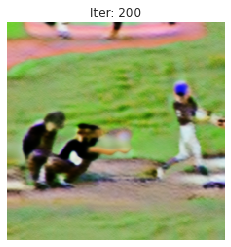

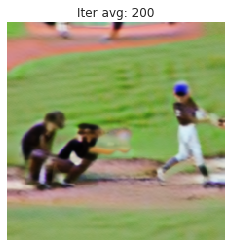

img min max:
0.8716307 0.14957562
loss tensor(0.1633, device='cuda:0', grad_fn=<MseLossBackward0>)


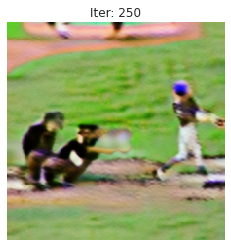

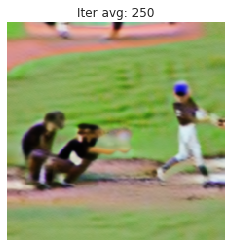

img min max:
0.8716307 0.14957562
loss tensor(0.1577, device='cuda:0', grad_fn=<MseLossBackward0>)


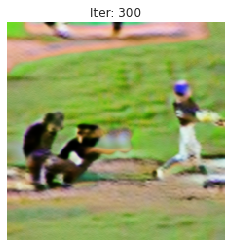

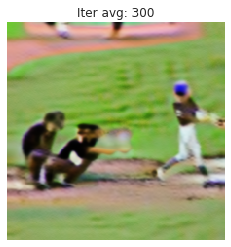

img min max:
0.8716307 0.14957562
loss tensor(0.1584, device='cuda:0', grad_fn=<MseLossBackward0>)


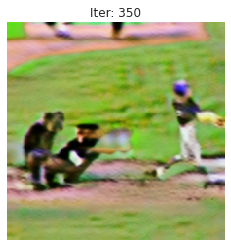

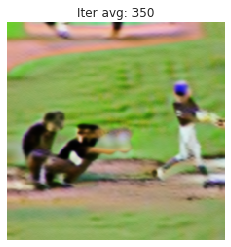

img min max:
0.8716307 0.14957562
loss tensor(0.1577, device='cuda:0', grad_fn=<MseLossBackward0>)


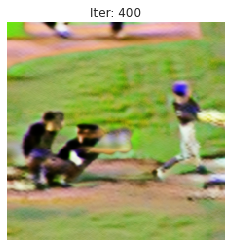

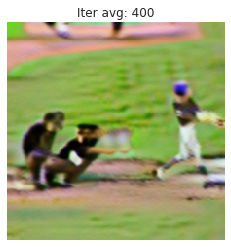

img min max:
0.8716307 0.14957562
loss tensor(0.1525, device='cuda:0', grad_fn=<MseLossBackward0>)


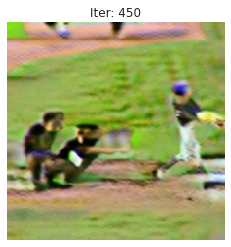

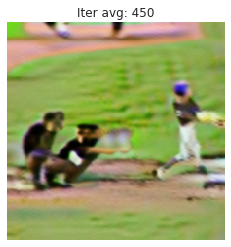

img min max:
0.8716307 0.14957562
loss tensor(0.1514, device='cuda:0', grad_fn=<MseLossBackward0>)


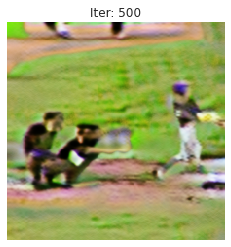

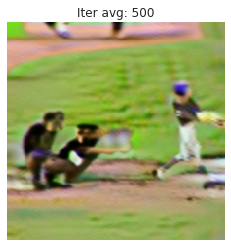

In [69]:
net = get_net(input_depth, 'skip', pad,
            skip_n33d=128, 
            skip_n33u=128,
            skip_n11=2,
            num_scales=3,
            upsample_mode='bilinear').type(dtype)

checkpoint = torch.load('dip_on_image.pth')
net.load_state_dict(checkpoint['net_state'])
out_avg = checkpoint['out_avg']

reg_noise_std = 1./30.
i = 0 
num_iter = 501 # max iterations

def total_variation_loss(img, weight= 1.0):
    bs_img, c_img, h_img, w_img = img.size()
    tv_h = torch.pow(img[:,:,1:,:]-img[:,:,:-1,:], 2).sum()
    tv_w = torch.pow(img[:,:,:,1:]-img[:,:,:,:-1], 2).sum()
    return weight*(tv_h+tv_w)/(bs_img*c_img*h_img*w_img)

    
# save tmp PSNR for different learning strategies
fancy_sgd_noise_psnr_list = [] # psnr between out and noise image
fancy_sgd_psnr_list = [] # psnr between sgd out and gt
fancy_sgd_expm_psnr_list = [] # psnr between exp avg and gt
fancy_sgd_out_1800 = None
fancy_sgd_expm_out_1800 = None

def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input, out_avg_np
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    out = net(net_input)

    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
    
    enc_in = (out-mean)/std
    vox_pred = model_roman(enc_in, inds_nc_torch.unsqueeze(0).cuda())
    
    loss = F.mse_loss(vox_pred, stroke_target_nc)#+total_variation_loss(out)+0.01*norm_6(out)#- 0.1*torch.mean(F.cosine_similarity(vox_pred, target))

    if i % show_every == 0:

        print('img min max:')
        print(rec_img_np.max(),rec_img_np.min())
        print('loss',loss)

    loss.backward()

    out_np = out.detach().cpu().numpy()[0]
    out_avg_np = out_avg.detach().cpu().numpy()[0]
    
    if i == save_iter:
        np.save(f'/home/jonathak/VisualEncoder/DIP_decoder/transformation_test/left_half_stroke_iter_{save_iter}_img_{img_idx}.npy',out_avg_np)
    
    if i % show_every == 0:
        np_plot(out.detach().cpu().numpy()[0], 'Iter: '+str(i))
        np_plot(out_avg_np, 'Iter avg: '+str(i))


    i += 1
    return loss

## Optimizing 
print('Starting optimization with ADAM')
optimizer = torch.optim.Adam(net.parameters(), lr=LR)
for j in range(num_iter):
    optimizer.zero_grad()
    closure()
    optimizer.step()

torch.cuda.empty_cache()
np.save(f'/home/jonathak/VisualEncoder/DIP_decoder/transformation_test/left_half_stroke_{img_idx}.npy',out_avg_np)

Analyzing the stroke transformation on the image

In [38]:
def np_diff_plot(img1, img2, title, threshold=0.1):
    plt.clf()
    # Compute the Euclidean norm (magnitude) across the 3 channels for each pixel
    diff = img1 - img2
    diff_magnitude = np.linalg.norm(diff, axis=0)
    
    # Apply threshold: keep only pixels where the magnitude is greater than the threshold
    diff_thresholded = np.where(diff_magnitude > threshold, diff_magnitude, 0)
    
    # Display the thresholded magnitude image using a perceptually uniform colormap
    im = plt.imshow(diff_thresholded, interpolation='nearest', cmap='viridis', vmin=0, vmax=1)
    plt.colorbar(im)
    plt.title(title)
    plt.axis('off')
    plt.pause(0.05)

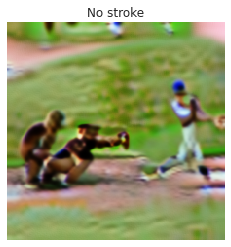

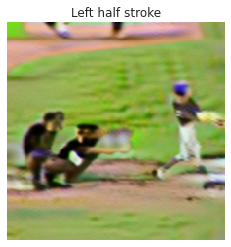

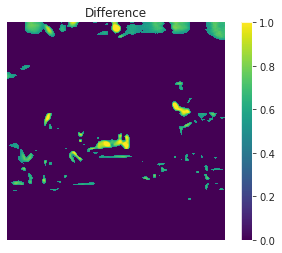

In [70]:
no_stroke = np.load('/home/jonathak/VisualEncoder/DIP_decoder/transformation_test/no_stroke_final_img_22.npy')
stroke = np.load('/home/jonathak/VisualEncoder/DIP_decoder/transformation_test/left_half_stroke_22.npy')

np_plot(no_stroke,'No stroke')
np_plot(stroke,'Left half stroke')
np_diff_plot(no_stroke, stroke, 'Difference', threshold=0.5)

In [42]:
def rgb_to_gray(rgb_image):
    """
    Convert an RGB image to grayscale using the standard luminosity method.
    If the image has shape (3, H, W), transpose it to (H, W, 3) first.
    """
    # Check for channels-first format
    if rgb_image.ndim == 3 and rgb_image.shape[0] == 3:
        rgb_image = np.transpose(rgb_image, (1, 2, 0))  # (H, W, 3)

    # Luminosity weights: (R * 0.2989 + G * 0.5870 + B * 0.1140)
    return np.dot(rgb_image[..., :3], [0.2989, 0.5870, 0.1140])

def np_diff_plot_grayscale(img1, img2, title, threshold=0.1):
    plt.clf()

    # 1. Convert both images to grayscale
    gray1 = rgb_to_gray(img1)
    gray2 = rgb_to_gray(img2)

    # 2. Compute absolute difference
    diff = np.abs(gray1 - gray2)

    # 3. Threshold: keep only significant differences
    diff_thresholded = np.where(diff > threshold, diff, 0)

    # 4. Visualize
    im = plt.imshow(diff_thresholded, cmap='viridis', interpolation='nearest',
                    vmin=0, vmax=1)
    plt.colorbar(im)
    plt.title(title)
    plt.axis('off')
    plt.pause(0.05)


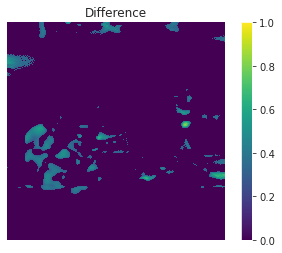

In [46]:
np_diff_plot_grayscale(no_stroke, stroke, 'Difference', threshold=0.3)

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2lab

def ensure_hw3(image):
    """
    Ensures the image is in (H, W, 3) format.
    If in (3, H, W), transpose it.
    """
    if image.ndim == 3 and image.shape[0] == 3:
        return np.transpose(image, (1, 2, 0))  # (H, W, 3)
    return image

def np_diff_plot_lab_luminance(img1, img2, title, threshold=0.1):
    plt.clf()

    # 1. Ensure images are in (H, W, 3) format
    img1_hw3 = ensure_hw3(img1)
    img2_hw3 = ensure_hw3(img2)

    # 2. Convert both to Lab color space
    lab1 = rgb2lab(img1_hw3)
    lab2 = rgb2lab(img2_hw3)

    # 3. Extract the L (lightness) channel
    L1 = lab1[..., 0]
    L2 = lab2[..., 0]

    # 4. Compute the absolute difference in the lightness channel
    diff = np.abs(L1 - L2)

    # 5. Threshold the difference
    diff_thresholded = np.where(diff > threshold, diff, 0)

    # 6. Visualize
    #   Note: The range of L* in Lab is typically [0, 100], but if you're working
    #   in [0,1] normalized images, you may need to adjust your thresholds.
    im = plt.imshow(diff_thresholded, cmap='viridis', interpolation='nearest')
    plt.colorbar(im)
    plt.title(title)
    plt.axis('off')
    plt.pause(0.05)


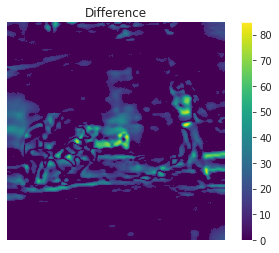

In [66]:
np_diff_plot_lab_luminance(no_stroke, stroke, 'Difference', threshold=10)

Looks good, now moving to bottom-right for comparison

In [32]:
stroke_hemisphere_bottom_right = 'lh'
threshold_bottom_right = 0.9
masked_voxels_path_bottom_right = '/home/jonathak/VisualEncoder/Results/all_masks_excluded_imgs/quadrant_mask_quad-bottom_right_mask_mean_voxels.pt'
stroke_indices = stroke_predictor.create_stroked_voxels(img_idx, stroke_sub, stroke_hemisphere_bottom_right, threshold_bottom_right, original_voxels_path, masked_voxels_path_bottom_right, only_indices=True)

stroke_target_all_bottom_right = original_target_all.clone().detach()
stroke_target_all_bottom_right[0, stroke_indices] = 0
stroke_target_all_bottom_right = stroke_target_all_bottom_right.float()
stroke_target_nc_bottom_right = stroke_target_all_bottom_right[:,inds_nc]

# Counting stroke voxels in the nc case
num_stroke_nc = torch.sum((original_target_nc != 0) & (stroke_target_nc_bottom_right == 0))

# Moving to cuda
stroke_target_all_bottom_right = stroke_target_all_bottom_right.to(device)
stroke_target_nc_bottom_right = stroke_target_nc_bottom_right.to(device)

# Checking all is well
print(f"Num of stroke indices in the nc case: {num_stroke_nc} out of {stroke_target_nc_bottom_right.shape[1]}")
print('Original target all:', original_target_all.shape, original_target_all.device)
print('Stroke target all:', stroke_target_all_bottom_right.shape, stroke_target_all_bottom_right.device)
print('Original target nc:', original_target_nc.shape, original_target_nc.device)
print('Stroke target nc:', stroke_target_nc.shape, stroke_target_nc.device)


Num of stroke indices: 718 out of 39548
Num of stroke indices in the nc case: 668 out of 13138
Original target all: torch.Size([1, 39548]) cuda:0
Stroke target all: torch.Size([1, 39548]) cuda:0
Original target nc: torch.Size([1, 13138]) cuda:0
Stroke target nc: torch.Size([1, 13138]) cuda:0


Starting optimization with ADAM
img min max:
0.8851002 0.15086183
loss tensor(0.2758, device='cuda:0', grad_fn=<MseLossBackward0>)


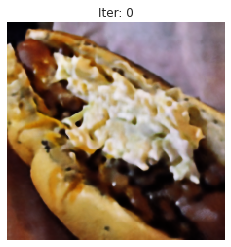

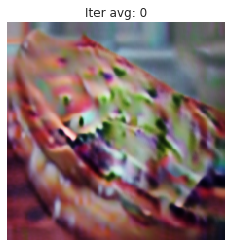

img min max:
0.8851002 0.15086183
loss tensor(0.1364, device='cuda:0', grad_fn=<MseLossBackward0>)


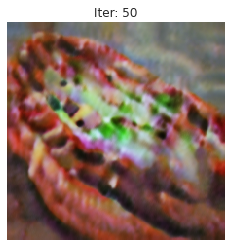

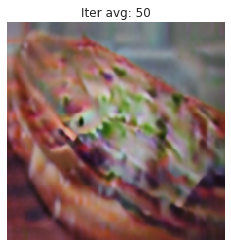

img min max:
0.8851002 0.15086183
loss tensor(0.1294, device='cuda:0', grad_fn=<MseLossBackward0>)


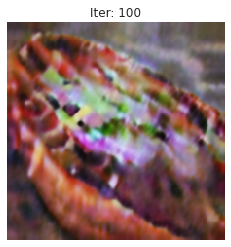

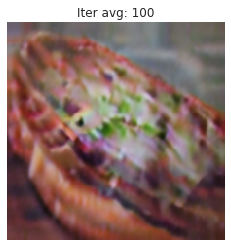

img min max:
0.8851002 0.15086183
loss tensor(0.1239, device='cuda:0', grad_fn=<MseLossBackward0>)


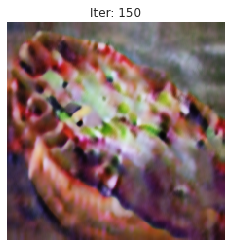

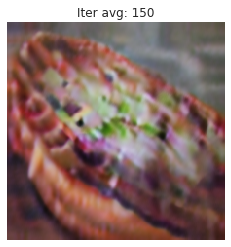

img min max:
0.8851002 0.15086183
loss tensor(0.1230, device='cuda:0', grad_fn=<MseLossBackward0>)


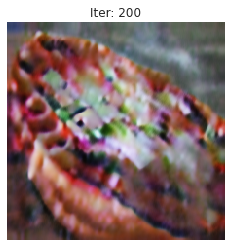

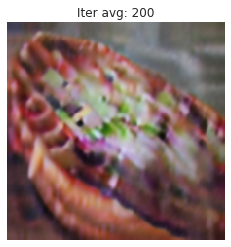

img min max:
0.8851002 0.15086183
loss tensor(0.1204, device='cuda:0', grad_fn=<MseLossBackward0>)


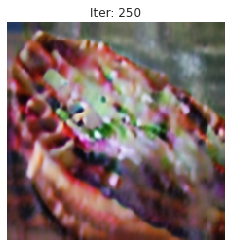

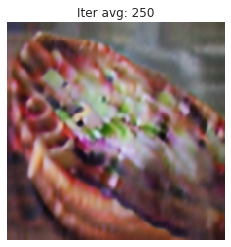

img min max:
0.8851002 0.15086183
loss tensor(0.1144, device='cuda:0', grad_fn=<MseLossBackward0>)


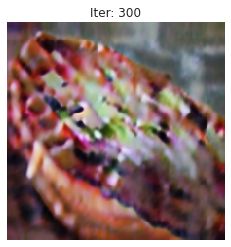

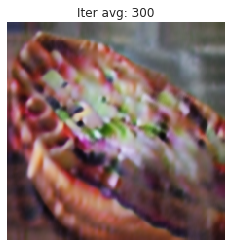

img min max:
0.8851002 0.15086183
loss tensor(0.1129, device='cuda:0', grad_fn=<MseLossBackward0>)


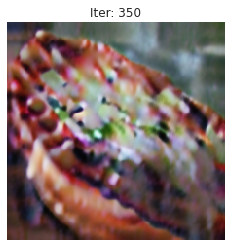

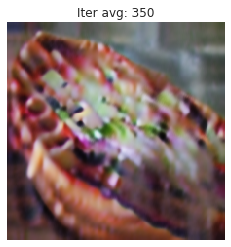

img min max:
0.8851002 0.15086183
loss tensor(0.1176, device='cuda:0', grad_fn=<MseLossBackward0>)


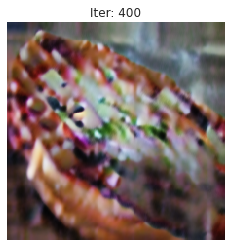

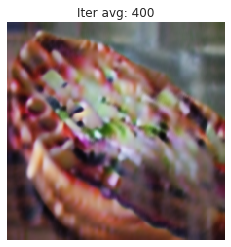

img min max:
0.8851002 0.15086183
loss tensor(0.1132, device='cuda:0', grad_fn=<MseLossBackward0>)


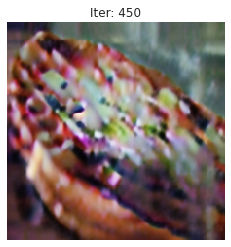

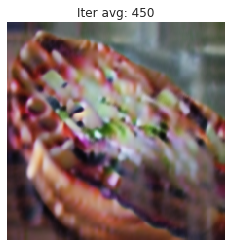

img min max:
0.8851002 0.15086183
loss tensor(0.1107, device='cuda:0', grad_fn=<MseLossBackward0>)


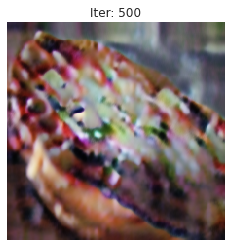

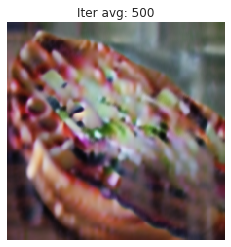

In [33]:
net = get_net(input_depth, 'skip', pad,
            skip_n33d=128, 
            skip_n33u=128,
            skip_n11=2,
            num_scales=3,
            upsample_mode='bilinear').type(dtype)

checkpoint = torch.load('dip_on_image.pth')
net.load_state_dict(checkpoint['net_state'])

reg_noise_std = 1./30.
i = 0 
num_iter = 501 # max iterations

def total_variation_loss(img, weight= 1.0):
    bs_img, c_img, h_img, w_img = img.size()
    tv_h = torch.pow(img[:,:,1:,:]-img[:,:,:-1,:], 2).sum()
    tv_w = torch.pow(img[:,:,:,1:]-img[:,:,:,:-1], 2).sum()
    return weight*(tv_h+tv_w)/(bs_img*c_img*h_img*w_img)

    
# save tmp PSNR for different learning strategies
fancy_sgd_noise_psnr_list = [] # psnr between out and noise image
fancy_sgd_psnr_list = [] # psnr between sgd out and gt
fancy_sgd_expm_psnr_list = [] # psnr between exp avg and gt
fancy_sgd_out_1800 = None
fancy_sgd_expm_out_1800 = None

def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    out = net(net_input)

    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
    
    enc_in = (out-mean)/std
    vox_pred = model_roman(enc_in, inds_nc_torch.unsqueeze(0).cuda())
    
    loss = F.mse_loss(vox_pred, stroke_target_nc_bottom_right)#+total_variation_loss(out)+0.01*norm_6(out)#- 0.1*torch.mean(F.cosine_similarity(vox_pred, target))

    if i % show_every == 0:

        print('img min max:')
        print(rec_img_np.max(),rec_img_np.min())
        print('loss',loss)

    loss.backward()

    out_np = out.detach().cpu().numpy()[0]
    out_avg_np = out_avg.detach().cpu().numpy()[0]

    if i % show_every == 0:
        np_plot(out.detach().cpu().numpy()[0], 'Iter: '+str(i))
        np_plot(out_avg_np, 'Iter avg: '+str(i))


    i += 1
    return loss

## Optimizing 
print('Starting optimization with ADAM')
optimizer = torch.optim.Adam(net.parameters(), lr=LR)
for j in range(num_iter):
    optimizer.zero_grad()
    closure()
    optimizer.step()

torch.cuda.empty_cache()